# Image Reconstruction and Map to Parcellations

In [1]:
import pyvista as pv
pv.set_jupyter_backend('static')

In [2]:
import time

import matplotlib.pyplot as p
import numpy as np
import xarray as xr
from IPython.display import Image

import cedalion
import cedalion.dataclasses as cdc
import cedalion.datasets
import cedalion.geometry.registration
import cedalion.geometry.segmentation
import cedalion.imagereco.forward_model as fw
import cedalion.imagereco.tissue_properties
import cedalion.io
import cedalion.plots
from cedalion.imagereco.solver import pseudo_inverse_stacked

xr.set_options(display_expand_data=False);

## Load a finger-tapping dataset 

For this demo we load an example finger-tapping recording through `cedalion.datasets.get_fingertapping`. The file contains a single NIRS element with one block of raw amplitude data. 

In [3]:
rec = cedalion.datasets.get_fingertapping()

The location of the probes is obtained from the snirf metadata (i.e. /nirs0/probe/)

Note that units ('m') are adopted and the coordinate system is named 'digitized'.

In [4]:
geo3d_meas = rec.geo3d
display(geo3d_meas)

Magnitude,[[-0.041613204679326624 0.026799775287857947 0.1299043936308115] [-0.06476686499872276 0.05814256998996063 0.0908425773727145] [-0.07120554551675068 -0.012874272652217859 0.10787860947691345] [-0.0859043654400404 0.018971698468891116 0.06509762433137256] [0.03694171596700852 0.02748380530252158 0.13022129709104263] [0.06065133742692848 0.05882414589197514 0.09117717995727878] [0.06712771392323756 -0.012199231886346213 0.1085725493643022] [0.08188685574250908 0.020427932162352107 0.06571325110115192] [-0.037619588707178915 0.06322851630256272 0.11572802770110814] [-0.04134445059646741 -0.011779611291995052 0.13495002938154654] [-0.07242424650162711 0.02347293206381116 0.10322218957482163] [-0.07912592748234686 0.05140929117919257 0.057370046083468226] [0.03352717285472944 0.06359968341212022 0.11583881331702946] [0.03686639505686032 -0.011397164907962862 0.13536724076864515] [0.06791592703520163 0.02468254467119271 0.10366605207860985] [0.075310088095807 0.05226884499005337 0.05787698428594235] [-0.03773895423262196 0.034082658086024245 0.1294919790818403] [-0.061454307897075164 0.06443800208211416 0.09061004226260877] [-0.07282878975853647 -0.00527870527992114 0.10743054838539287] [-0.08439610638498087 0.02706123378098264 0.06559510739262155] [0.040013338219712126 0.020439745814301982 0.13063767506528579] [0.06428020193514211 0.05162125732852231 0.09133632943784001] [0.06521393141744246 -0.019260368037897515 0.10880928230870081] [0.08272091030272573 0.012990608473329186 0.06658402323335233] [-0.0824899918305801 3.5272652784690273e-09 -8.985265795291575e-10] [6.534060185275914e-12 0.11404663614484922 -8.956669156345853e-09] [0.08248999697928468 3.893090638057428e-09 4.766247813092761e-10] [-0.04018770669918394 0.044642295725887106 0.12357659157001165] [-0.04174110787598461 0.007685839199884737 0.13437743644514044] [-0.05885642692737942 0.026136335712672674 0.11745327806321545] [0.03851939726517181 0.03078283979366837 0.1281798987708399] [-0.052808259274512416 0.06188780045911764 0.10403189889709587] [-0.06922421433143165 0.04108974212744533 0.0972095427514579] [-0.07351067792317667 0.05556043944468993 0.07592438053279707] [0.031418413207589764 0.05609701242391968 0.12112072355182572] [-0.05798909959739463 -0.013176608236818512 0.12293491786782985] [-0.07419549041066105 0.00549319711704184 0.10669158774707252] [0.023828589288117673 0.003996293896988853 0.14081960191362605] [-0.08184195746940305 0.022098763709400317 0.08422485645365857] [-0.08309090979477994 0.03520830182778492 0.0610323268526085] [0.026425335781627597 0.043375220063173334 0.12939415639453739] [0.035781770725957916 0.04568049698512951 0.12354633505671649] [0.037556277679295876 0.008001190852073497 0.134555406719549] [0.054080633753515184 0.026705026363902817 0.11818464121484251] [0.06801076312164317 0.02284818084680601 0.10445872040876931] [0.0481712114118228 0.062034828924799924 0.10518292837437133] [0.06461419274656584 0.042329086589563227 0.0977770136200937] [0.06967032405092426 0.05604290375898291 0.07590918892077606] [0.07526945345643418 0.037578919664336574 0.08007431341875021] [0.05288202968424921 -0.012139614237985343 0.12430811820847815] [0.06938013615060833 0.0069016618704050535 0.10806432085401242] [0.07932239267332403 -0.00044800545870984573 0.08903670686337778] [0.07756024143390347 0.022515587935674892 0.08578432016555051] [0.07912303758068968 0.036496511669642975 0.06257633565753129] [0.08225821050778642 0.01751423306824721 0.06619028345490524]]
Units,meter


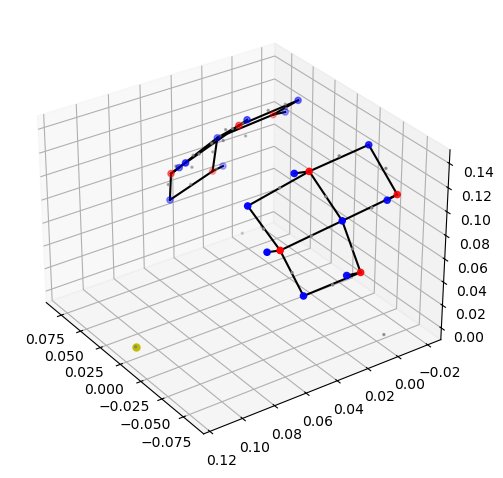

In [5]:
cedalion.plots.plot_montage3D(rec["amp"], geo3d_meas)

The measurement list is a `pandas.DataFrame` that describes which source detector pairs form channels.

In [6]:
meas_list = rec._measurement_lists["amp"]
display(meas_list.head(5))

,sourceIndex,detectorIndex,wavelengthIndex,wavelengthActual,wavelengthEmissionActual,dataType,dataUnit,dataTypeLabel,dataTypeIndex,sourcePower,detectorGain,moduleIndex,sourceModuleIndex,detectorModuleIndex,channel,source,detector,wavelength,chromo
0,1,1,1,None,None,1,None,None,1,None,None,None,None,None,S1D1,S1,D1,760.0,None
1,1,1,2,None,None,1,None,None,1,None,None,None,None,None,S1D1,S1,D1,850.0,None
2,1,2,1,None,None,1,None,None,1,None,None,None,None,None,S1D2,S1,D2,760.0,None
3,1,2,2,None,None,1,None,None,1,None,None,None,None,None,S1D2,S1,D2,850.0,None
4,1,3,1,None,None,1,None,None,1,None,None,None,None,None,S1D3,S1,D3,760.0,None


Event/stimulus information is also stored in a `pandas.DataFrame`. Here events are given more descriptive names:

In [7]:
rec.stim.cd.rename_events( {
        "1.0" : "control",
        "2.0" : "Tapping/Left",
        "3.0" : "Tapping/Right"
})
display(rec.stim.groupby("trial_type")[["onset"]].count())

,onset
trial_type,
15.0,2
Tapping/Left,30
Tapping/Right,30
control,30


(for this demo select 20 seconds after a trial starts at t=117s and transform raw amplitudes to optical density)

Transform CW raw amplitudes to optical density

In [8]:
raw_amp = rec["amp"]
rec["od"] = -np.log( raw_amp/ raw_amp.mean("time"))
display(rec["od"])

Magnitude,[[[0.040420720851589244 0.04460046098449573 0.0442158667266921 ... 0.010876348689028297 0.01189058853204466 0.006847636450666034] [0.023820496835156947 0.020076986081598715 0.03480909472899116 ... 0.023992850639162802 0.027040875264083337 0.031732993935654014]] [[-0.008280063468686781 -0.01784405593180633 -0.002198739340328898 ... -0.003592058220542012 -0.006742726672860488 -0.0047443982578777594] [-0.03725579234490354 -0.04067296052603699 -0.028261149412724014 ... 0.008275386235838757 0.005771141488662178 0.0051515177576299375]] [[0.1005582275517943 0.09914287354277777 0.11119025710690507 ... -0.02830701101541003 -0.023242770227372977 -0.023590421283804962] [0.04993799639529682 0.047551763623795935 0.06016311306879892 ... -0.005456229532249399 -0.0015308884573803712 -0.004733085331725723]] ... [[0.09543410489184105 0.11098678842280141 0.10684828479073329 ... -0.038599718102985896 -0.03566192105523218 -0.04378947818067423] [0.03858010875753767 0.06286432773409747 0.06128249638988582 ... 0.008314104856099373 0.007674359302522161 -0.0026751405572218796]] [[0.15506580435158798 0.17214467649471782 0.16880746748060918 ... -0.06854981498765861 -0.06838218329243445 -0.07333574448986935] [0.10250044669095155 0.12616269025036977 0.1261907782199553 ... -0.040611038136814874 -0.040371126750177955 -0.04750589562552556]] [[0.0580532188103781 0.06125157285758024 0.06083507429037254 ... -0.019157798285875216 -0.019003174994086804 -0.020343916456372766] [0.02437701777814723 0.030886638430615728 0.03219054575814673 ... -0.01108594305570406 -0.010936510768482734 -0.013167265399560904]]]
Units,dimensionless


## Calculate block averages in optical density

In [9]:
rec["od_freqfiltered"] = rec["od"].cd.freq_filter(fmin=0.02, fmax=0.5, butter_order=4)

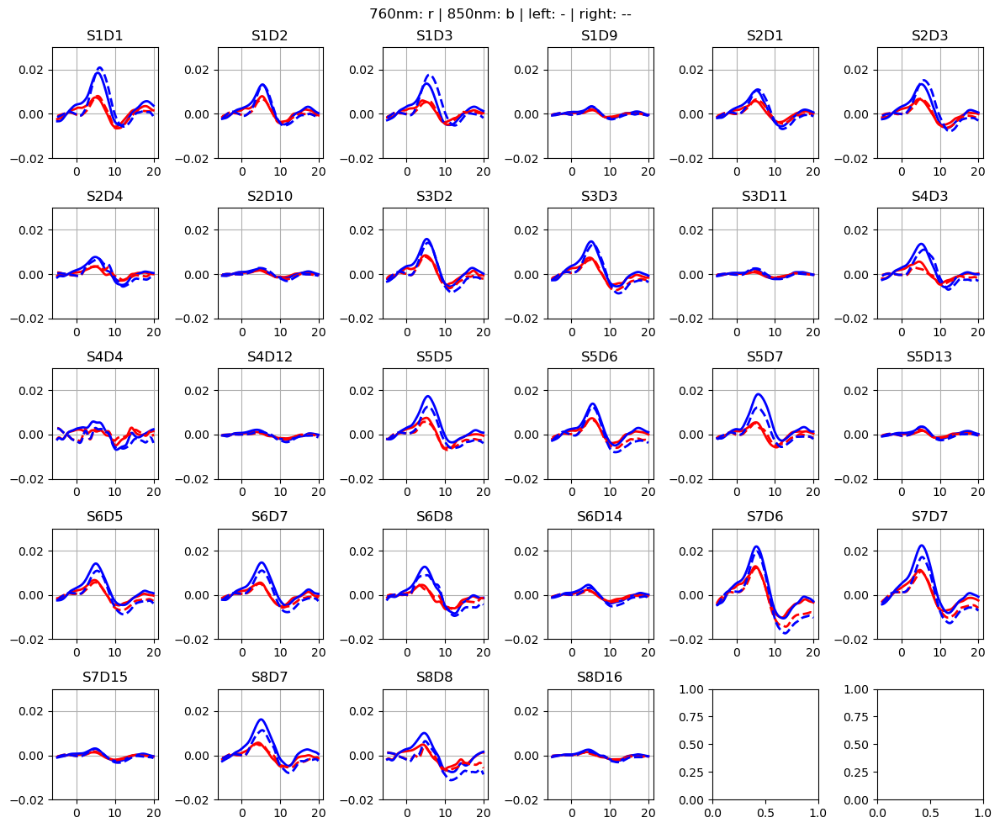

In [10]:
epochs = rec["od_freqfiltered"].cd.to_epochs(
        rec.stim, # stimulus dataframe
        ["Tapping/Left", "Tapping/Right"],  # select events
        before=5, # seconds before stimulus
        after=20  # seconds after stimulus
)

# calculate baseline
baseline = epochs.sel(reltime=(epochs.reltime < 0)).mean("reltime")
# subtract baseline
epochs_blcorrected = epochs - baseline

# group trials by trial_type. For each group individually average the epoch dimension
blockaverage = epochs_blcorrected.groupby("trial_type").mean("epoch")

# show results
f,ax = p.subplots(5,6, figsize=(12,10))
ax = ax.flatten()
for i_ch, ch in enumerate(blockaverage.channel):
    for ls, trial_type in zip(["-", "--"], blockaverage.trial_type):    
        ax[i_ch].plot(blockaverage.reltime, blockaverage.sel(wavelength=760, trial_type=trial_type, channel=ch), "r", lw=2, ls=ls)
        ax[i_ch].plot(blockaverage.reltime, blockaverage.sel(wavelength=850, trial_type=trial_type, channel=ch), "b", lw=2, ls=ls)
    ax[i_ch].grid(1)
    ax[i_ch].set_title(ch.values)
    ax[i_ch].set_ylim(-.02, .03)
    

p.suptitle("760nm: r | 850nm: b | left: - | right: --")
p.tight_layout()



## Load segmented MRI scan

For this example use a segmentation of the ICBM152 average brain. The directory also contains parcellations mask file created using Schaefer 2018 atlas in Freesurfer.

In [11]:
SEG_DATADIR, mask_files, landmarks_file = cedalion.datasets.get_icbm152_segmentation()

The segmentation masks are in individual niftii files. The dict `mask_files` maps mask filenames relative to `SEG_DATADIR` to short labels. These labels describe the tissue type of the mask. 

In principle the user is free to choose these labels. However, they are later used to lookup the tissue's optical properties. So they must be map to one of the tabulated tissue types (c.f. `cedalion.imagereco.tissue_properties.TISSUE_LABELS`).

The variable `landmarks_file` holds the path to a file containing landmark positions in scanner space (RAS). This file can be created with Slicer3D.

In [12]:
display(SEG_DATADIR)
display(mask_files)
display(landmarks_file)

'/Users/shakiba/Library/Caches/cedalion/ICBM152(2020).zip.unzip/ICBM152(2020)'

{'csf': 'mask_csf.nii',
 'gm': 'mask_gray.nii',
 'scalp': 'mask_skin.nii',
 'skull': 'mask_bone.nii',
 'wm': 'mask_white.nii',
 'air': 'mask_air.nii',
 'parcels': 'parcellation_mask_600.nii'}

'landmarks.mrk.json'

## The TwoSurfaceHeadModel

The photon propagation considers the complete MRI scan, in which each voxel is attributed to one tissue type with its respective optical properties. However, the image reconstruction does not intend to reconstruct absorption changes in each voxel. The inverse problem is simplified, by considering only two surfaces (scalp and brain) and reconstruct only absorption changes in voxels close to these surfaces.

The class `cedalion.imagereco.forward_model.TwoSurfaceHeadModel` groups together the segmentation mask, landmark positions and affine transformations as well as the scalp and brain surfaces. The brain surface is calculated by grouping together white and gray matter masks. The scalp surface encloses the whole head.

In [13]:
head_mask_files = mask_files.copy()
head_mask_files.pop('air', None)
head_mask_files.pop('parcels', None)

head = fw.TwoSurfaceHeadModel.from_segmentation(
    segmentation_dir=SEG_DATADIR,
    mask_files = head_mask_files,
    landmarks_ras_file=landmarks_file
)

## Optode Registration
The optode coordinates from the recording must be aligned with the scalp surface. Currently, `cedaĺion` offers a simple registration method, which finds an affine transformation (scaling, rotating, translating) that matches the landmark positions of the head model and their digitized counter parts. Afterwards, optodes are snapped to the nearest vertex on the scalp.

In [14]:
geo3d_snapped_ijk = head.align_and_snap_to_scalp(geo3d_meas)
display(geo3d_snapped_ijk)

Magnitude,[[54.85444756493949 135.7704517827475 231.43019273192118] [34.928058590683534 167.00374576983998 192.8100602307299] [21.68278577050374 97.25349340105278 208.030895992947] [14.732585384690964 131.8934101567271 165.0603016259684] [137.0123030442366 136.01101436701043 231.42833582032608] [155.83116713924306 169.4137062110982 192.0179987122823] [170.42228312214365 98.99177755447445 208.01761644762308] [177.0684956413755 132.97953864018928 163.9704228923075] [58.976426247165634 172.90333298447308 215.36217411439978] [52.981964292051885 95.99150557333829 238.42241635923335] [25.934877807071572 136.1459981739858 201.64701127104428] [22.699192464447886 163.01613374537828 158.00715213261657] [130.78055193277652 172.133968851997 217.40616659581667] [138.2776781686535 100.76247447007388 238.7967787628454] [166.43008651067427 133.76415746142885 202.15317779239643] [168.37956735408468 165.1300390434512 160.1223894696758] [59.84827965505072 143.76377116043767 231.42995115954074] [38.26995768328747 174.93822862187065 190.4411136923814] [21.68833079018136 106.23401566485866 208.02009623199692] [15.895181573235298 139.0206359901417 165.72333321583142] [136.66701766249474 133.12035148451804 233.06618622695288] [159.07297226094647 163.8102507759961 192.00306169015303] [168.32857546464004 92.0083732561289 210.02801937236842] [178.3309353908134 124.9717112957465 168.07307418784865] [15.935015306653177 117.0806601136243 100.10526757663813] [95.9811064953761 217.11883051148166 108.17386230045163] [176.0598522658896 118.99117401958082 102.98885613775153] [56.8453878965463 155.76096462219328 224.41690420582867] [51.836838977372146 121.76655718114468 234.4409286527714] [38.607219134115766 136.24359644354652 217.80779765621566] [137.68766187895199 142.10135394829453 229.06968483520933] [46.11489167412357 171.2604117159941 204.93333223819675] [30.095513242020637 151.29665957587585 197.90129466979448] [27.107461454123747 166.74941018558798 174.4669151970906] [128.90575602300328 168.0377859451334 221.34592372321407] [35.61215385828973 94.02406654633248 224.86312554228024] [22.20820118209147 116.66065536307124 206.28599183330363] [122.91020038112053 115.00266235070147 244.26347766533087] [17.667610184391883 135.1078214746022 181.00227615193472] [17.70169198870814 145.98107403604206 158.96037043498598] [125.01871325161497 155.02906107267336 230.4287262785116] [133.89595475064434 157.36650192948585 224.85815987508232] [136.03143089838932 119.02092254338214 237.41860532232664] [153.4212373119492 137.77418372267155 217.13288250467994] [165.88470744598254 133.46857581256896 203.75245315624574] [144.40518752376704 170.77188801072793 207.0265878616348] [161.8949589995209 153.4588159135128 196.7628987464641] [163.07186056579485 167.66785830154768 178.12224725541734] [170.3708445391194 149.12289319645362 180.11143666468465] [152.03102704071742 101.00553198120633 229.30800931815116] [169.7574880061985 119.03183474779613 205.1795984461374] [177.07698952576533 112.14907534294903 189.12629327077178] [173.33885894923807 135.0074887700013 185.1052649725367] [173.30560594181708 149.01347532448142 164.22717728073206] [177.071679843237 132.12625031922812 166.10686291514358]]
Units,dimensionless


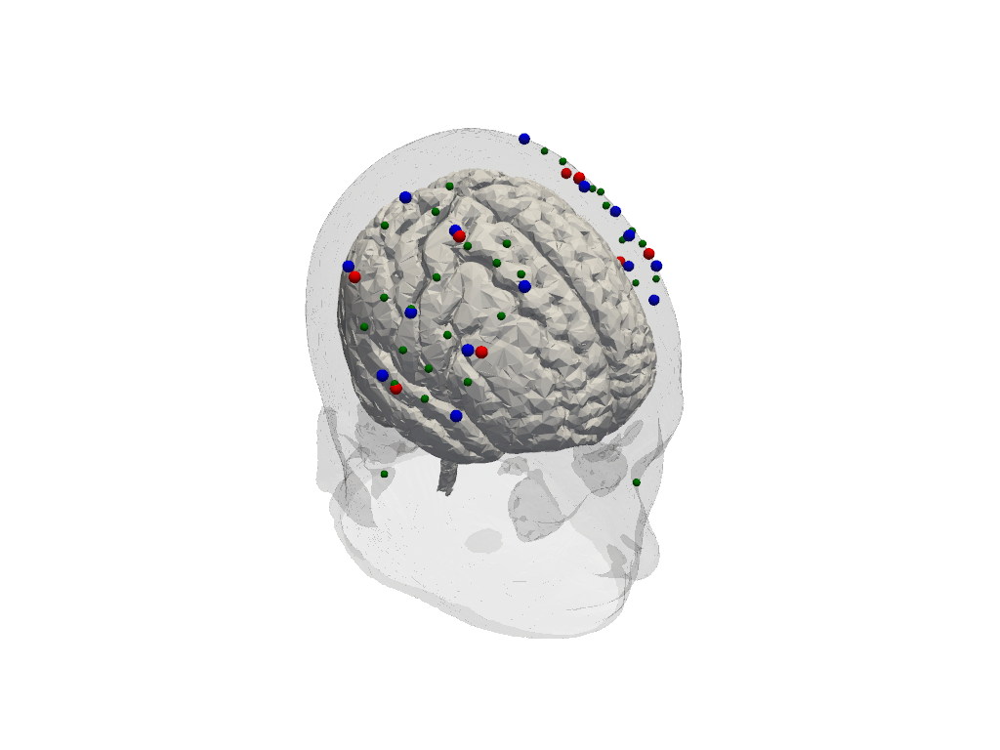

In [15]:
plt = pv.Plotter()
cedalion.plots.plot_surface(plt, head.brain, color="w")
cedalion.plots.plot_surface(plt, head.scalp, opacity=.1)
cedalion.plots.plot_labeled_points(plt, geo3d_snapped_ijk)
plt.show()

## Simulate light propagation in tissue with MCX

`cedalion.imagereco.forward_model.ForwardModel` is a wrapper around pmcx. Using the data in the head model it prepares the inputs for pmcx and offers functionality to calculate the sensitivty matrix.

In [16]:
fwm = cedalion.imagereco.forward_model.ForwardModel(head, geo3d_snapped_ijk, meas_list)

### Run the simulation

The `compute_fluence` method puts a simulated light source at each optode position and calulcates the fluence in each voxel.

In [17]:
RUN_MCX = False

if RUN_MCX:
    fluence_all, fluence_at_optodes = fwm.compute_fluence()
else:
    fluence_all, fluence_at_optodes = cedalion.datasets.get_parcel_example_fluence()

## Plot fluence

To illustrate the tissue probed by light travelling from a source to the detector two fluence profiles need to be multiplied. 

/opt/anaconda3/envs/cedalion_dev/lib/python3.11/site-packages/xarray/core/variable.py:338: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  data = np.asarray(data)


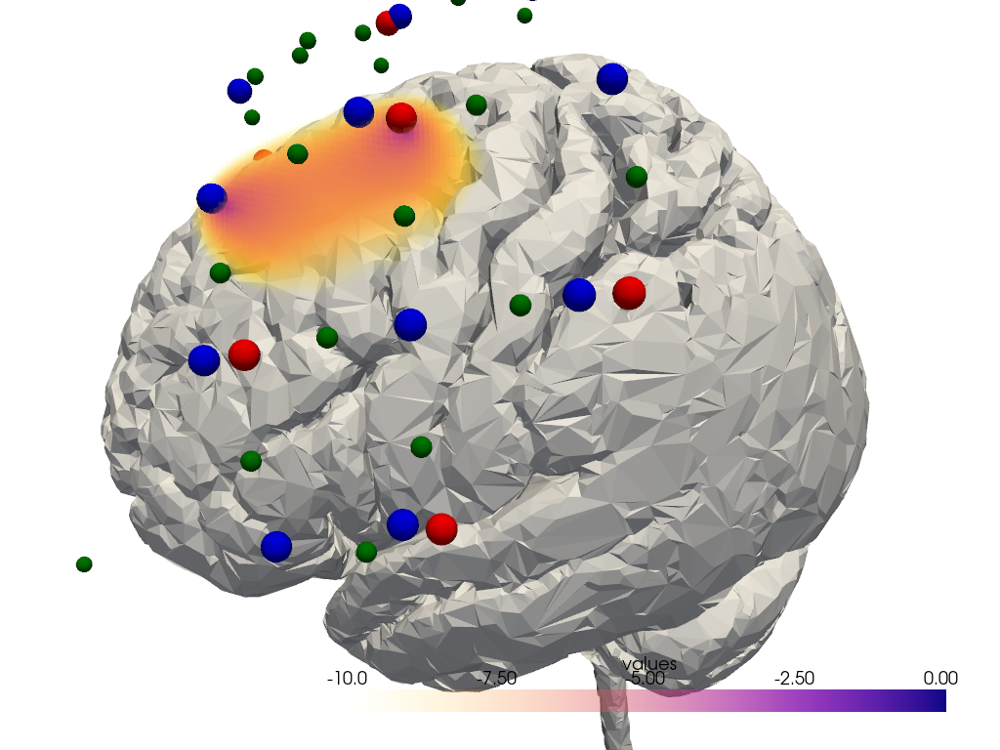

In [18]:
time.sleep(1)

plt = pv.Plotter()

f = fluence_all.loc["S1", 760].values * fluence_all.loc["D1",760].values
f[f==0] = f[f!=0].min()
f = np.log10(f)
vf = pv.wrap(f)

plt.add_volume(
    vf,
    log_scale=False, 
    cmap='plasma_r',
    clim=(-10,0),
)
cedalion.plots.plot_surface(plt, head.brain, color="w")
cedalion.plots.plot_labeled_points(plt, geo3d_snapped_ijk)

cog = head.brain.vertices.mean("label").values
plt.camera.position = cog + [-300,30, 150]
plt.camera.focal_point = cog 
plt.camera.up = [0,0,1] 

plt.show()

### Calculate the sensitivity matrices

The sensitivity matrix describes the effect of an absorption change at a given surface vertex in the OD recording in a given channel and at given wavelength. The coordinate `is_brain` holds a mask to distinguish brain and scalp voxels.

In [19]:
Adot = fwm.compute_sensitivity(fluence_all, fluence_at_optodes)
Adot

<xarray.DataArray (channel: 28, vertex: 59909, wavelength: 2)> Size: 27MB
1.274e-14 1.274e-14 4.767e-14 4.767e-14 ... 3.205e-16 3.205e-16 0.0 0.0
Coordinates:
  * channel     (channel) <U5 560B 'S1D1' 'S1D2' 'S1D3' ... 'S8D8' 'S8D16'
  * wavelength  (wavelength) float64 16B 760.0 850.0
    is_brain    (vertex) bool 60kB True True True True ... False False False
Dimensions without coordinates: vertex

The sensitivity `Adot` has shape (nchannel, nvertex, nwavelenghts). To solve the inverse problem we need a matrix that relates OD in channel space to absorption in image space. Hence, the sensitivity must include the extinction coefficients to translate between OD and concentrations. Furthermore, channels at different wavelengths must be  stacked as well vertice and chromophores into new dimensions (flat_channel, flat_vertex):

$$ \left( \begin{matrix} OD_{c_1, \lambda_1} \\ \vdots \\ OD_{c_N,\lambda_1} \\ OD_{c_1,\lambda_2} \\ \vdots \\ OD_{c_N,\lambda_2} \end{matrix}\right) = A \cdot
\left( \begin{matrix} \Delta c_{v_1, HbO} \\ \vdots \\ \Delta c_{v_N, HbO} \\ \Delta c_{v_1, HbR} \\ \vdots \\ \Delta c_{v_N, HbR} \end{matrix}\right) $$

In [20]:
Adot_stacked = fwm.compute_stacked_sensitivity(Adot)
Adot_stacked

/opt/anaconda3/envs/cedalion_dev/lib/python3.11/site-packages/xarray/core/variable.py:338: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  data = np.asarray(data)


<xarray.DataArray (flat_channel: 56, flat_vertex: 119818)> Size: 54MB
1.719e-12 6.432e-12 9.502e-12 3.381e-11 ... 3.393e-12 5.95e-13 5.102e-14 0.0
Dimensions without coordinates: flat_channel, flat_vertex

### Invert the sensitivity matrix

In [21]:
B = pseudo_inverse_stacked(Adot_stacked)
nvertices = B.shape[0]//2
B = B.assign_coords({"chromo" : ("flat_vertex", ["HbO"]*nvertices  + ["HbR"]* nvertices)})
B = B.set_xindex("chromo")
B

<xarray.DataArray (flat_vertex: 119818, flat_channel: 56)> Size: 54MB
-8.694e-14 -4.625e-14 2.094e-13 2.809e-14 -2.685e-15 ... 0.0 0.0 0.0 0.0 0.0
Coordinates:
  * chromo   (flat_vertex) <U3 1MB 'HbO' 'HbO' 'HbO' 'HbO' ... 'HbR' 'HbR' 'HbR'
Dimensions without coordinates: flat_vertex, flat_channel

### Calculate concentration changes

- the optical density has shape (nchannel, nwavelength, time) -> stack channel and wavelength dimension into new flat_channel dimension

In [22]:
blockaverage

Magnitude,[[[[-0.0023540689141305794 -0.0023514693910278634 -0.0023336289507136453 ... 0.0016985653520397784 0.0016116903308528352 0.0015383586881786893] [-0.0033849404656839813 -0.0033815229812506273 -0.0033755071341012234 ... 0.004088385772015945 0.003890350710548579 0.003695273410678871]] [[-0.0015244160284010044 -0.0014816711391156872 -0.0014541252314285524 ... -0.0005314516857365311 -0.0006269514544674051 -0.0006908552790624439] [-0.0022907102576988888 -0.0022285458951754353 -0.0021734719946907765 ... 0.000514945774084045 0.00040440157776281484 0.00029709186162387016]] [[-0.0016094063353048263 -0.0016134564698401662 -0.0016170031560023663 ... 0.00046103095148290616 0.0004070052018782542 0.00035182123557838773] [-0.0028957464237962605 -0.0028253147219855106 -0.0027420723767755525 ... 0.0014483223513775902 0.0013390113234123106 0.0012178202734314844]] ... [[-0.0017289561492859534 -0.001581716368051487 -0.0014305421179766804 ... -0.001216637070558516 -0.0012778308047218339 -0.0013571497189351484] [-0.0026538588667585827 -0.0025328165888575008 -0.0023990480535337594 ... 0.0009909501607740492 0.0008160764782183289 0.0006190032354383889]] [[-0.0016841218762446897 -0.0015351263234091898 -0.0014483148374082801 ... 0.0012914915038173107 0.0013054542955468452 0.0012982294364548648] [-0.001878511626639771 -0.0017494671180635299 -0.001683391103294369 ... 0.001504849488936338 0.0015749073177228209 0.0016234035083167824]] [[-0.0005853544970790635 -0.0005306186684989115 -0.00047226536600722017 ... -0.0004492921695088471 -0.00048518793675285827 -0.0005212018785886743] [-0.0007703685997421431 -0.0007202043623811291 -0.0006644936625102696 ... -0.0003073840907234592 -0.000348832350076576 -0.0003931681284606871]]] [[[-0.0010155908590110643 -0.000962816616708477 -0.0008871896032434484 ... 0.0003346892926071743 0.00010563981295389826 -0.00013740860191454514] [-0.001556678647546544 -0.0014558825195659542 -0.001351247325878658 ... -0.0005327661053071288 -0.0008777455908339087 -0.0012226558165352403]] [[-0.0011601471339413578 -0.0010667833833295462 -0.0009719155092853957 ... -0.0007943935330516267 -0.0009430712907718997 -0.0011185674845606364] [-0.0021382344439551688 -0.001955357158597244 -0.0017442143561729449 ... -0.0015917884460428795 -0.0017559203077365732 -0.0019138924682499663]] [[-0.0012047991700406336 -0.0011757479550092375 -0.0011169060157919255 ... -0.00015758642330459207 -0.0003039399686990324 -0.00046163942525104755] [-0.0016640933909005027 -0.0015612055052780585 -0.0014352232244931424 ... -0.0015057945907618214 -0.0016886996425790135 -0.0018588897899774845]] ... [[-0.001094303647588667 -0.001042086746877094 -0.0009819985680415576 ... -0.00094077814806446 -0.0009880197119458835 -0.001049562055769437] [-0.0016010158399818923 -0.0014297345513323222 -0.0012600895182976527 ... -0.002092771981755583 -0.002292136407086068 -0.0024986765840009696]] [[0.0013559925386517416 0.0013391272885520942 0.001307383891031104 ... -0.004689272131016372 -0.005216144193986232 -0.005749486699590651] [0.0010079930886018565 0.001062541498659773 0.0010925405864892935 ... -0.007583535125760752 -0.00809934385106973 -0.008621321796209114]] [[-0.00018222857328628565 -0.0001558862897772513 -0.00013329633712511247 ... -0.0003228341089677971 -0.00035632009258954766 -0.0003962480464717025] [-0.00031008733886866876 -0.00026883181513854155 -0.00022919823548157086 ... -0.00046540620501929686 -0.0005120830962600265 -0.0005608931662389706]]]]
Units,dimensionless


In [23]:
od_stacked = blockaverage.stack({"flat_channel" : ["wavelength", "channel"]})
display(od_stacked)

Magnitude,[[[-0.0023540689141305794 -0.0015244160284010044 -0.0016094063353048263 ... -0.0026538588667585827 -0.001878511626639771 -0.0007703685997421431] [-0.0023514693910278634 -0.0014816711391156872 -0.0016134564698401662 ... -0.0025328165888575008 -0.0017494671180635299 -0.0007202043623811291] [-0.0023336289507136453 -0.0014541252314285524 -0.0016170031560023663 ... -0.0023990480535337594 -0.001683391103294369 -0.0006644936625102696] ... [0.0016985653520397784 -0.0005314516857365311 0.00046103095148290616 ... 0.0009909501607740492 0.001504849488936338 -0.0003073840907234592] [0.0016116903308528352 -0.0006269514544674051 0.0004070052018782542 ... 0.0008160764782183289 0.0015749073177228209 -0.000348832350076576] [0.0015383586881786893 -0.0006908552790624439 0.00035182123557838773 ... 0.0006190032354383889 0.0016234035083167824 -0.0003931681284606871]] [[-0.0010155908590110643 -0.0011601471339413578 -0.0012047991700406336 ... -0.0016010158399818923 0.0010079930886018565 -0.00031008733886866876] [-0.000962816616708477 -0.0010667833833295462 -0.0011757479550092375 ... -0.0014297345513323222 0.001062541498659773 -0.00026883181513854155] [-0.0008871896032434484 -0.0009719155092853957 -0.0011169060157919255 ... -0.0012600895182976527 0.0010925405864892935 -0.00022919823548157086] ... [0.0003346892926071743 -0.0007943935330516267 -0.00015758642330459207 ... -0.002092771981755583 -0.007583535125760752 -0.00046540620501929686] [0.00010563981295389826 -0.0009430712907718997 -0.0003039399686990324 ... -0.002292136407086068 -0.00809934385106973 -0.0005120830962600265] [-0.00013740860191454514 -0.0011185674845606364 -0.00046163942525104755 ... -0.0024986765840009696 -0.008621321796209114 -0.0005608931662389706]]]
Units,dimensionless


multiply with the inverted sensitivity matrix. contracts over flat_channel and the flat_vertex dimension remains

In [24]:
dC = B @ od_stacked
dC

Magnitude,[[[-2.018871991458039e-14 -1.8395013534115998e-14 -1.6806168317125718e-14 ... 8.86717757770547e-15 9.680585763837608e-15 1.0472717209238282e-14] [9.468386946298983e-15 1.0482807750310651e-14 1.135933096902664e-14 ... -2.1778799837886144e-14 -2.4351752822978444e-14 -2.7226270135200558e-14]] [[-3.33235913660479e-14 -2.984299398144909e-14 -2.7005964483978517e-14 ... 2.417045029068816e-14 2.5818356507210334e-14 2.7397671744389214e-14] [2.7068613719437484e-14 2.8350032965213343e-14 2.92948356698794e-14 ... -3.8624728107604803e-14 -4.4620808880508174e-14 -5.1137781143913314e-14]] [[-3.670556610034171e-14 -3.350876682015716e-14 -3.064012056262389e-14 ... 1.4840009891938262e-14 1.6284315222622146e-14 1.7695632010545023e-14] [1.5746202313262908e-14 1.7643437576973305e-14 1.9304939376415335e-14 ... -3.912997198585962e-14 -4.355848386985553e-14 -4.853128050513349e-14]] ... [[-1.6241176418025895e-22 -1.8282434156780208e-22 -2.15240168258287e-22 ... 5.393016006323783e-22 5.4737508781313715e-22 5.544785869849306e-22] [3.2229496596230154e-22 3.152980826134393e-22 3.0630166535920303e-22 ... -7.233062862998813e-22 -8.34324766722466e-22 -9.392590436316342e-22]] [[-2.3737657438408727e-24 -1.4173940631232415e-24 -2.797632781769069e-25 ... -1.5091596555035665e-23 -1.542500218647648e-23 -1.5769808651108452e-23] [-5.070186316110735e-24 -5.073573887023603e-24 -5.0335732031005394e-24 ... 1.0495017676086434e-23 1.190091916331771e-23 1.3135344893061456e-23]] [[0.0 0.0 0.0 ... 0.0 0.0 0.0] [0.0 0.0 0.0 ... 0.0 0.0 0.0]]]
Units,dimensionless


## Plot concentration changes

Using functionality from pyvista and VTK plot the concentration changes on the brain surface

In [25]:
b = cdc.VTKSurface.from_trimeshsurface(head.brain)
b = pv.wrap(b.mesh)

In [26]:
# plot brain surface

for trial_type, gif_fname in [("Tapping/Left", "hbo_left.gif"), ("Tapping/Right", "hbo_right.gif")]:

    hbo = dC.sel(chromo="HbO", trial_type=trial_type).pint.dequantify() / 1e-6 # FIXME unit handling
    hbo_brain = hbo[(Adot.is_brain == True).values,:]

    ntimes = hbo.sizes["reltime"]

    b = cdc.VTKSurface.from_trimeshsurface(head.brain)
    b = pv.wrap(b.mesh)
    b["reco_hbo"] = (hbo_brain[:,0] - hbo_brain[:,0])

    plt = pv.Plotter()

    plt.add_mesh(
        b,
        scalars="reco_hbo",
        cmap='seismic', # 'gist_earth_r', 
        clim=(-0.3,0.3),
        scalar_bar_args = {"title" : "HbO / µM"}
    )

    cedalion.plots.plot_labeled_points(plt, geo3d_snapped_ijk)


    tl = lambda tt : f"{trial_type} HbO rel. time: {tt:.3f} s"
    time_label = plt.add_text(tl(0))

    cog = head.brain.vertices.mean("label").values
    plt.camera.position = cog + [0,0,400]
    plt.camera.focal_point = cog 
    plt.camera.up = [0,1,0] 
    plt.reset_camera()

    plt.open_gif(gif_fname)

    for i in range(0,ntimes,3):
        b["reco_hbo"] = (hbo_brain[:,i] - hbo_brain[:,0])
        time_label.set_text("upper_left", tl(hbo_brain.reltime[i]))

        plt.write_frame()

    plt.close()

/opt/anaconda3/envs/cedalion_dev/lib/python3.11/site-packages/xarray/core/variable.py:338: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  data = np.asarray(data)
/opt/anaconda3/envs/cedalion_dev/lib/python3.11/site-packages/xarray/core/variable.py:338: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  data = np.asarray(data)


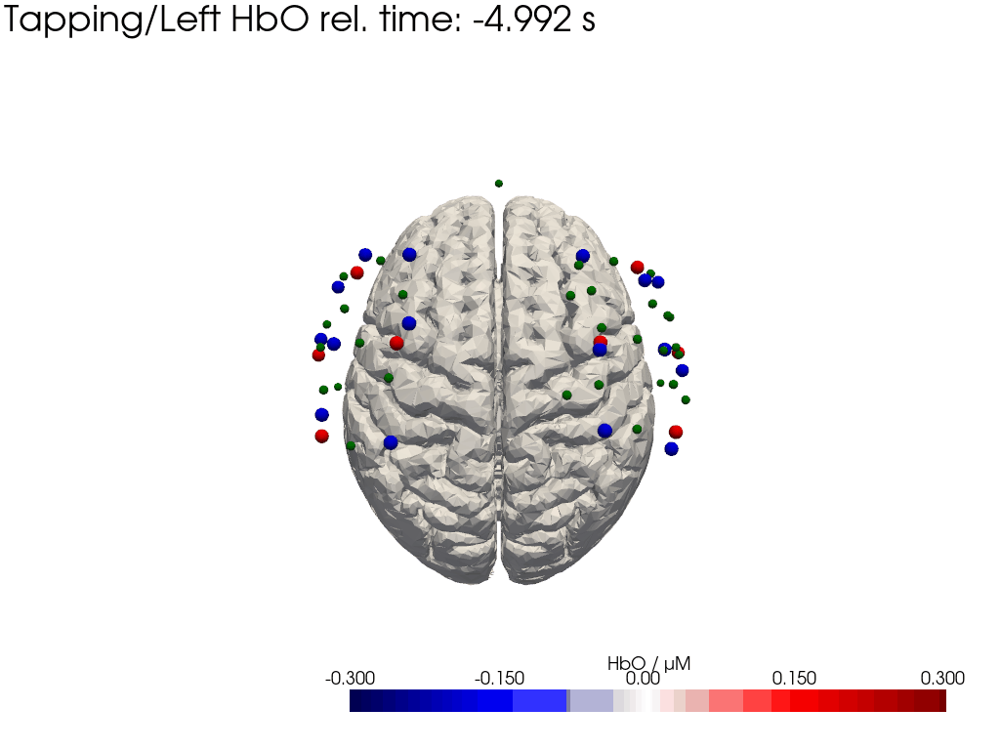

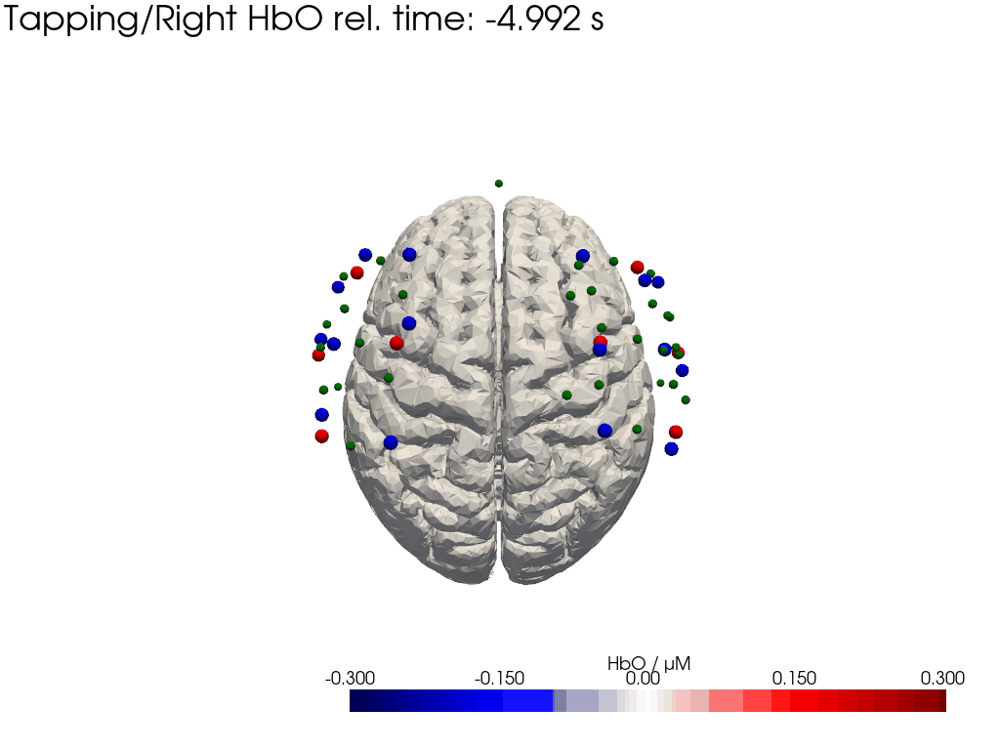

In [27]:
display(Image(data=open("hbo_left.gif",'rb').read(), format='png'))
display(Image(data=open("hbo_right.gif",'rb').read(), format='png'))

# Map to parcellations

The `cedalion.imagereco.forward_model.GrayMatterParcellationMapping` class is designed to load the parcellation mask, along with the associated label names and colors provided by the Schaefer atlas, from the segmentation directory. It then constructs a KD-tree based on the voxels within the different parcel regions. This KD-tree allows for efficient calculation of the nearest parcel for any given vertex by searching for the nearest neighbors within the tree.

In [28]:
parcels = fw.GrayMatterParcellationMapping.from_parcellation(
    segmentation_dir=SEG_DATADIR,
    gm_mask_file=mask_files["gm"],
    parcels_mask_file = mask_files["parcels"]
)

Labels are assigned based on the majority label among the three nearest voxels in the parcellation space.

In [29]:
vertices_labels = parcels.map_vertices_to_parcels(head.brain.vertices, 3)

/opt/anaconda3/envs/cedalion_dev/lib/python3.11/site-packages/xarray/core/variable.py:338: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  data = np.asarray(data)


The Schaefer Atlas assigns distinct colors to different parcellation labels. The `labels` variable maps numerical identifiers to their corresponding parcellation names, while `color_dict` maps these labels to their associated colors.

In [30]:
labels, color_dict = parcels.read_schaefer_atlas_labels(    
    segmentation_dir=SEG_DATADIR,
    schaefer_atlas_label_file="Schaefer2018_600Parcels_17Networks_order_LUT.txt"
    )

/Users/shakiba/Documents/repos/cedalion/src/cedalion/imagereco/forward_model.py:915: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  colors['color_code'] =  colors[['R', 'G', 'B']].astype(int).apply(tuple, axis=1)


## Plot Parcellations

In [31]:
colors = [color_dict[int(i)] for i in vertices_labels]
labels = labels[labels.label.isin(list(set(vertices_labels)))]

### Plot the brain surface with all parcellations

Plot the whole brain surface with their projected parcellations and related colors provided bu Schaefer Atlas. There are almost 600 different colors in this plot but the neighbor regions have near color codes; therefore, it might be difficult to distinguish the borders.

/opt/anaconda3/envs/cedalion_dev/lib/python3.11/site-packages/xarray/core/variable.py:338: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  data = np.asarray(data)


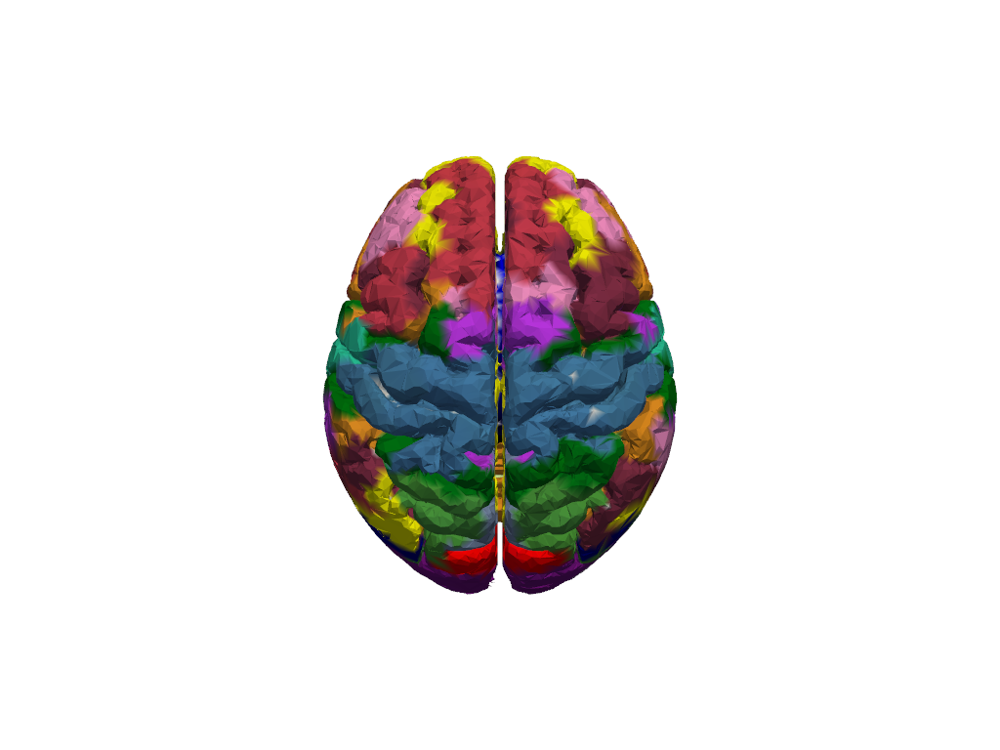

In [32]:
b = cdc.VTKSurface.from_trimeshsurface(head.brain)
b = pv.wrap(b.mesh)
b["parcels"] = colors

plt = pv.Plotter()

plt.add_mesh(
    b,
    scalars="parcels",
    rgb=True
)


cog = head.brain.vertices.mean("label").values
plt.camera.position = cog + [0,0,400]
plt.camera.focal_point = cog 
plt.camera.up = [0,1,0] 
plt.reset_camera()

plt.show()

### Plot the brain surface with a list of desired parcellations

To better understand the borders, you can specify a list of parcellation names. In the code section below, two regions (`"17Networks_RH_SomMotA_4"`, `"17Networks_RH_DorsAttnB_FEF_1"`) have been selected as examples. You can modify these names or add more regions as needed.

/opt/anaconda3/envs/cedalion_dev/lib/python3.11/site-packages/xarray/core/variable.py:338: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  data = np.asarray(data)


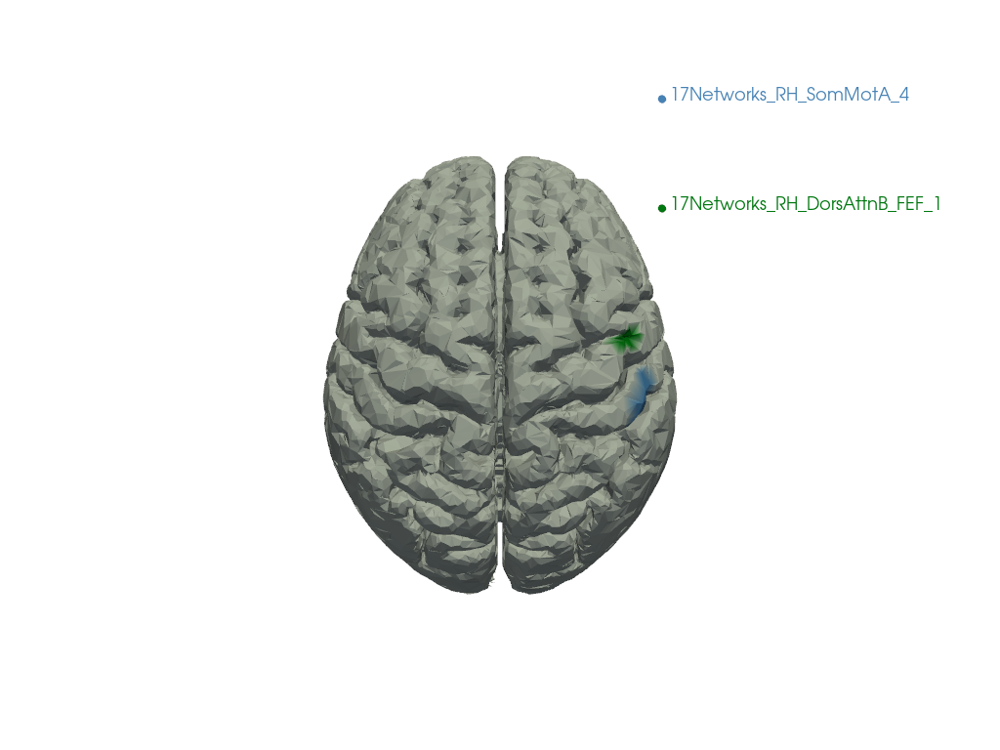

In [33]:
selected_parcels = ['17Networks_RH_SomMotA_4', '17Networks_RH_DorsAttnB_FEF_1']
selected_labels = labels.set_index('name').loc[selected_parcels,:]
selected_labels = selected_labels['label'].tolist()
selected_colors = [color_dict[i] for i in selected_labels]

b = cdc.VTKSurface.from_trimeshsurface(head.brain)
b = pv.wrap(b.mesh)
b["parcels"] = [i if i in selected_colors else (178, 190, 181) for i in colors]

plt = pv.Plotter()

plt.add_mesh(
    b,
    scalars="parcels",
    rgb=True
)


legends = tuple([list(a) for a in zip(selected_parcels, selected_colors)])
plt.add_legend(labels= legends, face='o', size=(0.3,0.3))


cog = head.brain.vertices.mean("label").values
plt.camera.position = cog + [0,0,400]
plt.camera.focal_point = cog 
plt.camera.up = [0,1,0] 
plt.reset_camera()

plt.show()

## Concentration changes in parcels

We can now calculate concentration changes for each parcellation label. For a specific parcel label, the concentration change is determined by averaging the concentration changes across the corresponding vertices.

In [34]:
brain_dC = dC[list((Adot.is_brain == True).values)*2, :]
brain_dC = brain_dC.assign_coords(parcel=('flat_vertex', list(vertices_labels)*2))

baseline = brain_dC.sel(reltime=(brain_dC.reltime == brain_dC.reltime[0]))
num_reps = brain_dC.reltime.shape[0]
baseline = [baseline] * num_reps

baseline = xr.concat(baseline, dim='reltime').values
brain_dC = brain_dC - baseline
     

cells = brain_dC.sel(chromo='HbO').pint.dequantify() / 1e-6
avg_HbO = cells.groupby('parcel').mean()

cells = brain_dC.sel(chromo='HbR').pint.dequantify() / 1e-6
avg_HbR = cells.groupby('parcel').mean()


/opt/anaconda3/envs/cedalion_dev/lib/python3.11/site-packages/xarray/core/variable.py:338: UnitStrippedWarning: The unit of the quantity is stripped when downcasting to ndarray.
  data = np.asarray(data)


In [35]:
avg_HbO

<xarray.DataArray (parcel: 608, trial_type: 2, reltime: 196)> Size: 2MB
0.0 1.45e-07 4.483e-07 9.08e-07 ... -1.488e-07 -1.528e-07 -1.563e-07 -1.588e-07
Coordinates:
  * reltime     (reltime) float64 2kB -4.992 -4.864 -4.736 ... 19.71 19.84 19.97
  * trial_type  (trial_type) object 16B 'Tapping/Left' 'Tapping/Right'
  * parcel      (parcel) int64 5kB 2 4 5 7 8 10 ... 2294 2295 2298 2299 2300

In [36]:
avg_HbR

<xarray.DataArray (parcel: 608, trial_type: 2, reltime: 196)> Size: 2MB
0.0 -3.377e-07 -7.688e-07 -1.228e-06 ... -7.906e-08 -7.789e-08 -7.821e-08
Coordinates:
  * reltime     (reltime) float64 2kB -4.992 -4.864 -4.736 ... 19.71 19.84 19.97
  * trial_type  (trial_type) object 16B 'Tapping/Left' 'Tapping/Right'
  * parcel      (parcel) int64 5kB 2 4 5 7 8 10 ... 2294 2295 2298 2299 2300

### Plot HbO and HbR

The Schaefer Atlas provides nearly 600 labels, making it impractical to plot concentration changes for all of them. Additionally, since we're using the Finger Tapping dataset with a limited set of optodes, many brain regions lack significant signal coverage due to the absence of optodes. To focus on relevant regions, we selected a subset of labels based on a criterion: the absolute value of either the minimum or maximum concentration change must exceed 0.01. Using this method, we identified 60 parcellations as `active_labels`.

In [37]:
active_labels = []
for i_par, par in enumerate(labels["label"].values):  
    if (avg_HbO.sel(parcel = par).max() > 0.01) or (avg_HbO.sel(parcel = par).min() < -0.01):
        active_labels.append(par)

print("Number of active labels is: ", len(active_labels))

Number of active labels is:  60


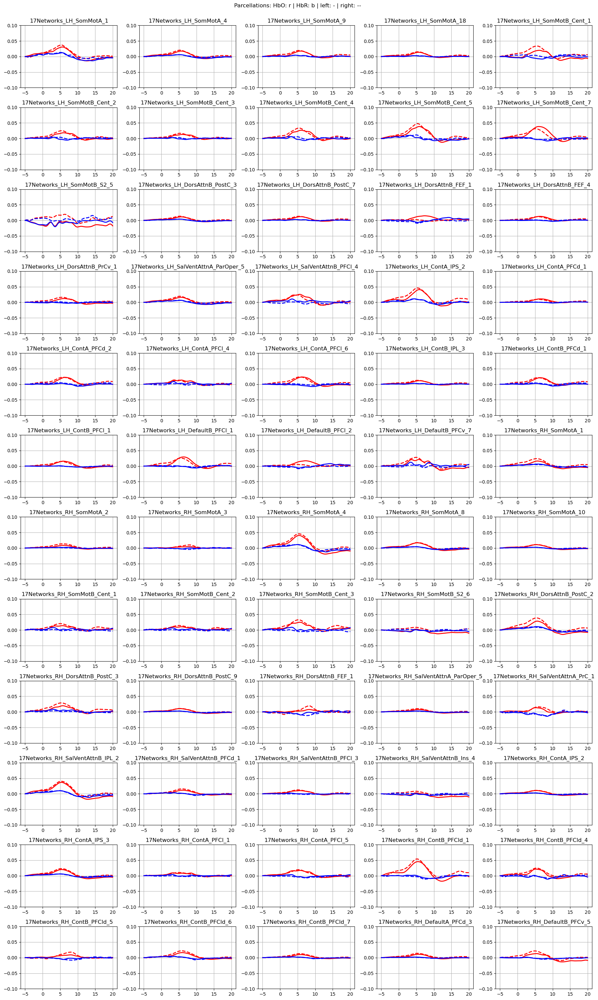

In [38]:
f,ax = p.subplots(12,5, figsize=(18,30))
ax = ax.flatten()
for i_par, par in enumerate(active_labels):   
    ax[i_par].plot(avg_HbO.sel(parcel = par, trial_type = 'Tapping/Left').reltime, avg_HbO.sel(parcel = par, trial_type = 'Tapping/Left').values, "r", lw=2, ls='--')
    ax[i_par].plot(avg_HbO.sel(parcel = par, trial_type = 'Tapping/Right').reltime, avg_HbO.sel(parcel = par, trial_type = 'Tapping/Right').values, "r", lw=2, ls='-')
    ax[i_par].plot(avg_HbR.sel(parcel = par, trial_type = 'Tapping/Left').reltime, avg_HbR.sel(parcel = par, trial_type = 'Tapping/Left').values, "b", lw=2, ls='--')
    ax[i_par].plot(avg_HbR.sel(parcel = par, trial_type = 'Tapping/Right').reltime, avg_HbR.sel(parcel = par, trial_type = 'Tapping/Right').values, "b", lw=2, ls='-')

    ax[i_par].grid(1)
    ax[i_par].set_title(labels[labels["label"] == par]["name"].values[0])
    ax[i_par].set_ylim(-.1, .1)
    

p.suptitle("Parcellations: HbO: r | HbR: b | left: - | right: --", y=1)
p.tight_layout()